In [1]:
#importing all the modules required
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import folium

### Import datasets

In [2]:
elections =  pd.read_csv('Datasets/comelec_reg_voters_1992-2016.csv')
poor_magnitude = pd.read_csv('Datasets/magnitude_poor_families_1991-2012.csv')
labor_growth = pd.read_csv('Datasets/labor_productivity_and_growth_rate_2015-2017.csv')
daily_wage = pd.read_csv('Datasets/average_daily_wage_2014-2017.csv')
labor_force = pd.read_csv('Datasets/average_labor_force_2016-2017.csv')

In [3]:
poor_magnitude.head()

,region,estimated_number_of_poor_families_1991,estimated_number_of_poor_families_2006,estimated_number_of_poor_families_2009,estimated_number_of_poor_families_2012
0,NCR,86388,73353,63974,76530
1,CAR,83557,66607,66111,65516
2,Region I,205171,191326,172726,154712
3,Region II,182360,142518,143847,130965
4,Region III,221205,206568,232928,240079


In [4]:
labor_force.head()

,region,average_labor_force_2016,average_labor_force_2017
0,NCR,5613,5552
1,CAR,800,778
2,Region I,2119,2045
3,Region II,1529,1499
4,Region III,4693,4548


In [5]:
labor_growth.head()

,region,labor_productivity_2015,labor_productivity_2016,labor_productivity_2017,growth_rate_2015,growth_rate_2016,growth_rate_2017
0,NCR,583029,568092,614293,5.9,-1.9,8.1
1,CAR,176348,178920,205921,2.6,1.1,15.1
2,Region I,117765,129415,146061,5.1,9.1,12.9
3,Region II,88918,94162,103015,2.2,3.7,9.4
4,Region III,171193,176388,198896,4.6,2.8,12.8


In [6]:
elections.head()

,region,total_number_registered_voters_1992,total_number_registered_voters_1995,total_number_registered_voters_1998,total_number_registered_voters_2001,total_number_registered_voters_2004,total_number_registered_voters_2007,total_number_registered_voters_2010,total_number_registered_voters_2013,total_number_registered_voters_2016,...,total_number_voters_who_actually_voted_2016,percentage_voters_turn_out_1992,percentage_voters_turn_out_1995,percentage_voters_turn_out_1998,percentage_voters_turn_out_2001,percentage_voters_turn_out_2004,percentage_voters_turn_out_2007,percentage_voters_turn_out_2010,percentage_voters_turn_out_2013,percentage_voters_turn_out_2016
0,NCR,4587600,5415082,5154122,5192424,5931572,5684943,6178966,5995904,6253249,...,4916589,73.16,56.63,80.57,63.06,67.99,62.10,69.07,70.39,78.62
1,CAR,593468,656947,591358,649282,762238,790010,905010,924751,906162,...,755772,75.71,74.42,87.23,79.66,78.24,74.93,76.37,77.74,83.40
2,Region I,1850585,2026564,1885892,2011436,2322803,2404012,2808712,2865115,2950775,...,2525358,81.71,79.57,91.51,82.66,84.19,80.68,81.09,82.52,85.58
3,Region II,1146450,1332572,1170668,1248151,1498501,1599510,1833137,1871822,1920952,...,1594813,77.33,72.17,88.64,78.86,77.88,74.01,75.64,78.85,83.02
4,Region III,3431573,4027363,3793175,4001866,4953027,5097299,5675830,5822678,6056392,...,4989374,77.68,71.57,88.26,77.32,77.05,72.77,76.30,78.06,82.38


In [7]:
daily_wage.head()

,region,average_daily_wage_2014,average_daily_wage_2015,average_daily_wage_2016,average_daily_wage_2017
0,NCR,520.66,529.92,561.74,567.29
1,CAR,406.73,415.56,432.00,432.46
2,Region I,299.97,315.53,341.24,362.18
3,Region II,294.37,300.16,316.57,343.24
4,Region III,364.66,376.41,404.46,412.97


### Merge all the datasets into 1 dataframe 

In [8]:
frames = [poor_magnitude,labor_growth,daily_wage,labor_force]

We iterate through our frames.

We first remove whitespace from region names and make it all uppercase characters using a lambda function. 

Afterwards, we merge the data frames using `region` as key

In [9]:
elections['region'] = elections['region'].apply(lambda x: x.rstrip().upper())

for i in frames:
    i['region'] = i['region'].apply(lambda x: x.rstrip().upper())
    elections = pd.merge(elections,i, on="region",how="outer")

In [10]:
elections.region.unique

<bound method Series.unique of 0             NCR
1             CAR
2        REGION I
3       REGION II
4      REGION III
5     REGION IV-A
6     REGION IV-B
7        REGION V
8       REGION VI
9      REGION VII
10    REGION VIII
11      REGION IX
12       REGION X
13      REGION XI
14     REGION XII
15         CARAGA
16           ARMM
Name: region, dtype: object>

In [11]:
elections.head(20)

,region,total_number_registered_voters_1992,total_number_registered_voters_1995,total_number_registered_voters_1998,total_number_registered_voters_2001,total_number_registered_voters_2004,total_number_registered_voters_2007,total_number_registered_voters_2010,total_number_registered_voters_2013,total_number_registered_voters_2016,...,labor_productivity_2017,growth_rate_2015,growth_rate_2016,growth_rate_2017,average_daily_wage_2014,average_daily_wage_2015,average_daily_wage_2016,average_daily_wage_2017,average_labor_force_2016,average_labor_force_2017
0,NCR,4587600,5415082,5154122,5192424,5931572,5684943,6178966,5995904,6253249,...,614293,5.9,-1.9,8.1,520.66,529.92,561.74,567.29,5613,5552
1,CAR,593468,656947,591358,649282,762238,790010,905010,924751,906162,...,205921,2.6,1.1,15.1,406.73,415.56,432.00,432.46,800,778
2,REGION I,1850585,2026564,1885892,2011436,2322803,2404012,2808712,2865115,2950775,...,146061,5.1,9.1,12.9,299.97,315.53,341.24,362.18,2119,2045
3,REGION II,1146450,1332572,1170668,1248151,1498501,1599510,1833137,1871822,1920952,...,103015,2.2,3.7,9.4,294.37,300.16,316.57,343.24,1529,1499
4,REGION III,3431573,4027363,3793175,4001866,4953027,5097299,5675830,5822678,6056392,...,198896,4.6,2.8,12.8,364.66,376.41,404.46,412.97,4693,4548
5,REGION IV-A,3478196,4108931,4066849,4378939,5525334,5743100,6771140,7205067,7619272,...,251050,5.6,-5.8,4.6,406.21,420.91,445.19,462.99,6125,6235
6,REGION IV-B,872082,1008843,897500,1010184,1191482,1267695,1475268,1552520,1589326,...,106839,1.6,6.8,6.6,305.80,330.70,326.27,349.76,1305,1309
7,REGION V,1922143,2108854,1868951,2079356,2431397,2550134,2874126,3037795,3121662,...,74841,4.8,8.0,6.3,303.25,310.64,324.50,353.51,2444,2414
8,REGION VI,2812031,3017766,2755218,3016682,3601807,3668321,3939551,4049640,4242153,...,112479,7.7,4.0,11.5,277.46,291.75,314.76,330.06,3369,3297
9,REGION VII,2474017,2578742,2526916,2785121,3299070,3460577,3942460,4114046,4375756,...,170962,1.7,6.0,5.4,326.56,339.41,351.20,367.32,3401,3378


### Most complete year?

2016 has the most data to work with, having 7 relevant features from our datasets

In [12]:
years = [x[-4:] for x in elections.columns]

for i in range(1990,2018):
    
    print(i, " " , years.count(str(i)))

1990   0
1991   1
1992   3
1993   0
1994   0
1995   3
1996   0
1997   0
1998   3
1999   0
2000   0
2001   3
2002   0
2003   0
2004   3
2005   0
2006   1
2007   3
2008   0
2009   1
2010   3
2011   0
2012   1
2013   3
2014   1
2015   3
2016   7
2017   4


### Let's create a dataframe using columns with 2016 data

We create a new dataframe that selects all the columns with "2016" in the column name

In [13]:
c = [x for x in elections.columns if "2016" in x or x == "region"]
df_2016 = elections[c]
print(c)

['region', 'total_number_registered_voters_2016', 'total_number_voters_who_actually_voted_2016', 'percentage_voters_turn_out_2016', 'labor_productivity_2016', 'growth_rate_2016', 'average_daily_wage_2016', 'average_labor_force_2016']


In [14]:
def getIslandGroup(region):
    luzon = ['REGION I', 'REGION II','REGION III','REGION IV-A','REGION IV-B','REGION V','NCR','CAR']
    visayas = ['REGION VI', 'REGION VII','REGION VIII']
    print(region)
    if region in luzon:
        return "Luzon"
    elif region in visayas:
        return "Visayas"
    else:
        return "Mindanao"

In [15]:
df_2016_2 = df_2016.drop(['total_number_voters_who_actually_voted_2016','labor_productivity_2016'], axis=1)
df_2016_2['average_labor_force_2016'] = df_2016_2['average_labor_force_2016']*1000
df_2016_2['IslandGroup'] = ""
df_2016_2['IslandGroup'] = df_2016_2['region'].apply(getIslandGroup)
df_2016_2

NCR
CAR
REGION I
REGION II
REGION III
REGION IV-A
REGION IV-B
REGION V
REGION VI
REGION VII
REGION VIII
REGION IX
REGION X
REGION XI
REGION XII
CARAGA
ARMM


,region,total_number_registered_voters_2016,percentage_voters_turn_out_2016,growth_rate_2016,average_daily_wage_2016,average_labor_force_2016,IslandGroup
0,NCR,6253249,78.62,-1.9,561.74,5613000,Luzon
1,CAR,906162,83.40,1.1,432.00,800000,Luzon
2,REGION I,2950775,85.58,9.1,341.24,2119000,Luzon
3,REGION II,1920952,83.02,3.7,316.57,1529000,Luzon
4,REGION III,6056392,82.38,2.8,404.46,4693000,Luzon
5,REGION IV-A,7619272,77.81,-5.8,445.19,6125000,Luzon
6,REGION IV-B,1589326,81.46,6.8,326.27,1305000,Luzon
7,REGION V,3121662,84.70,8.0,324.50,2444000,Luzon
8,REGION VI,4242153,84.47,4.0,314.76,3369000,Visayas
9,REGION VII,4375756,85.17,6.0,351.20,3401000,Visayas


In [16]:
getIslandGroup('REGION I')

REGION I


'Luzon'

In [17]:
import os
regions = os.path.join('Datasets', 'Regions.json')


m = folium.Map(location=[12.8797, 121.7740], zoom_start=5.5)

folium.Choropleth(
    geo_data=regions,
    name='choropleth',
    data=df_2016_2,
    columns=['region', 'percentage_voters_turn_out_2016'],
    key_on='feature.properties.REGION',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
).add_to(m)

folium.TileLayer('Mapbox Bright').add_to(m)

m.save('maps.html')
m



## Scatterplots

In [18]:
## function to add labels to points
def label_point(x, y, val, ax):
    a = pd.concat({'x': x, 'y': y, 'val': val}, axis=1)
    for i, point in a.iterrows():
        ax.text(point['x']-0.3, point['y'], str(point['val']))

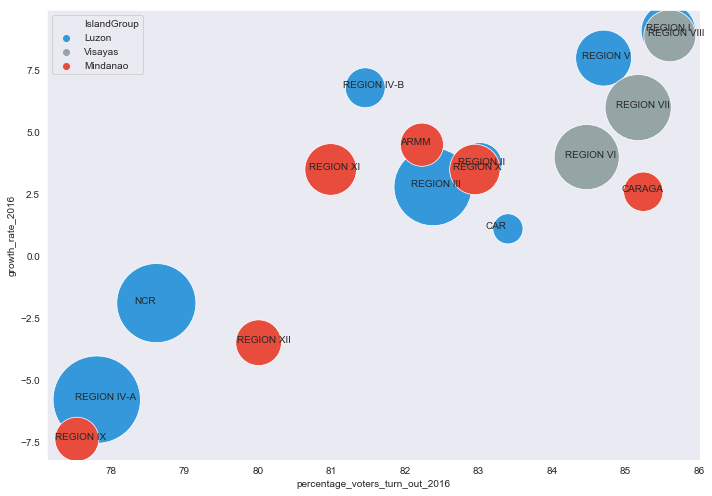

In [19]:
flatui = ["#3498db", "#95a5a6", "#e74c3c"]
pal = sns.color_palette(flatui)

sns.set_style("dark")

a4_dims = (11.7, 8.27)
fig, ax = plt.subplots(figsize=a4_dims)

x = sns.scatterplot(ax=ax,
                x="percentage_voters_turn_out_2016", y="growth_rate_2016", 
                data=df_2016_2,
                s=df_2016.total_number_registered_voters_2016/1000, hue=df_2016_2.IslandGroup,palette=pal)

label_point(df_2016.percentage_voters_turn_out_2016, df_2016.growth_rate_2016, df_2016.region, plt.gca())

figure = x.get_figure()    
figure.savefig('growth_rate_turnout.png', dpi=400)

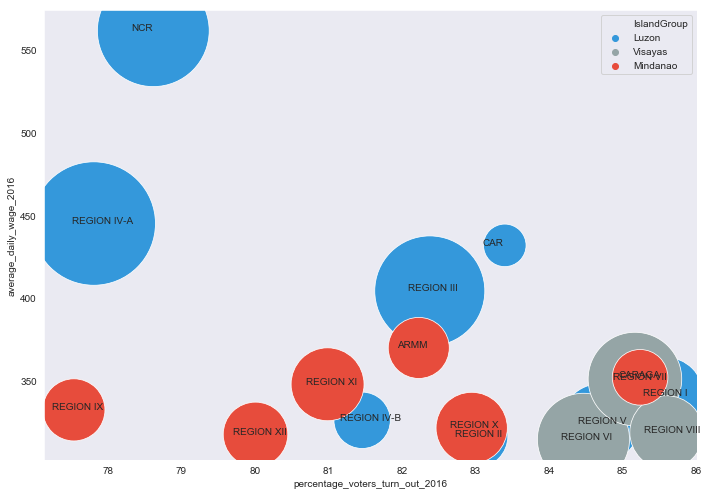

In [20]:
sns.set_style("dark")

a4_dims = (11.7, 8.27)
fig, ax = plt.subplots(figsize=a4_dims)

x = sns.scatterplot(ax=ax,
                x="percentage_voters_turn_out_2016", y="average_daily_wage_2016", 
                data=df_2016_2,
                s=df_2016.total_number_registered_voters_2016/500, hue=df_2016_2.IslandGroup,palette=pal)

label_point(df_2016.percentage_voters_turn_out_2016, df_2016.average_daily_wage_2016, df_2016.region, plt.gca())

figure = x.get_figure()    
figure.savefig('wages_turnout.png', dpi=400)

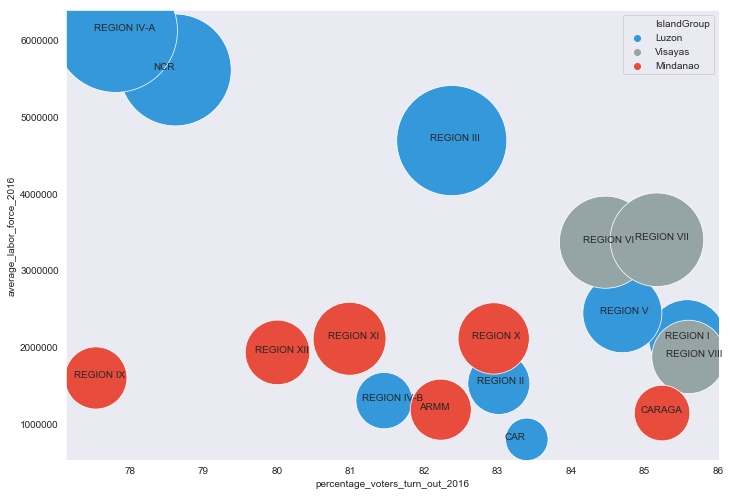

In [21]:
sns.set_style("dark")

a4_dims = (11.7, 8.27)
fig, ax = plt.subplots(figsize=a4_dims)

x = sns.scatterplot(ax=ax,
                x="percentage_voters_turn_out_2016", y="average_labor_force_2016", 
                data=df_2016_2,
                s=df_2016.total_number_registered_voters_2016/500, hue=df_2016_2.IslandGroup,palette=pal)

label_point(df_2016.percentage_voters_turn_out_2016, df_2016_2.average_labor_force_2016, df_2016.region, plt.gca())

figure = x.get_figure()    
figure.savefig('labor_turnout.png', dpi=400)

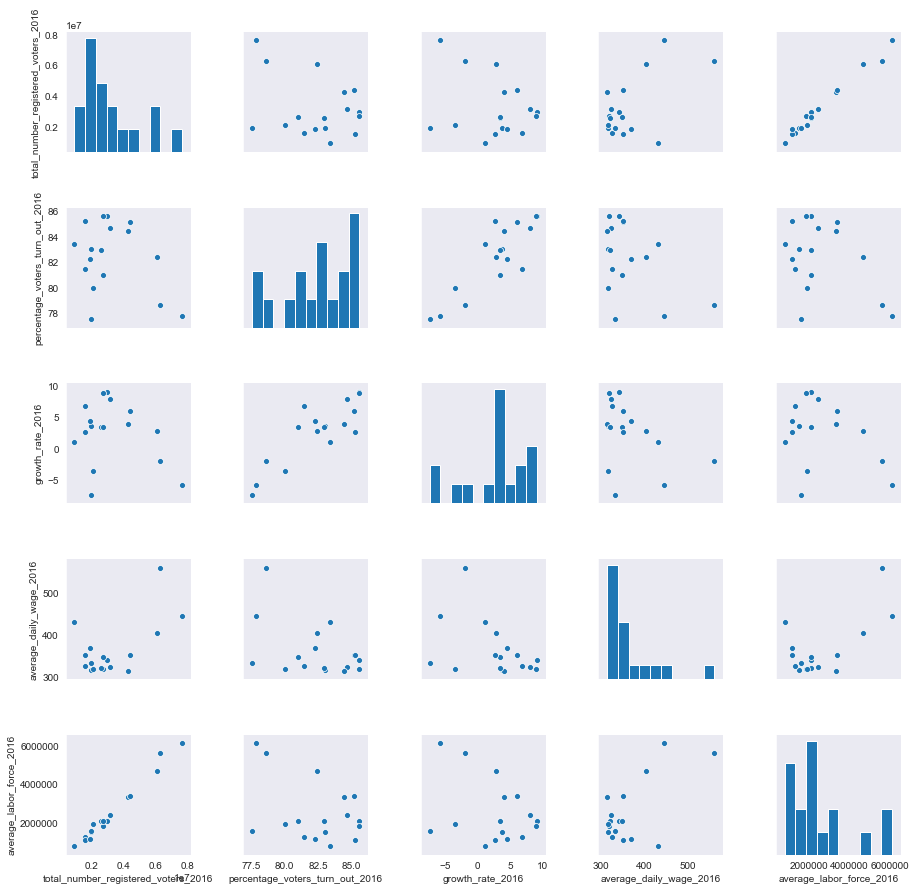

In [22]:
sns.pairplot(df_2016_2, palette=pal).savefig("pairplots.png")

## Interactive Scatter Plots

In [23]:
import plotly as py
import plotly.graph_objs as go

py.offline.init_notebook_mode(connected=True)

scale = 50000

trace0 = go.Scatter(
    x = df_2016_2[df_2016_2.IslandGroup == "Luzon"].percentage_voters_turn_out_2016,
    y = df_2016_2[df_2016_2.IslandGroup == "Luzon"].growth_rate_2016,
    name = 'Luzon',
    mode = 'markers+text',
    marker = dict(
        size = df_2016_2[df_2016_2.IslandGroup == "Luzon"].total_number_registered_voters_2016/scale,
        color = 'rgba(82, 179, 217, 1)',
        line = dict(
            width = 1,
            color = 'rgb(0, 0, 0)'
        )
    ),
    text = df_2016_2[df_2016_2.IslandGroup == "Luzon"].region
)

trace1 = go.Scatter(
    x = df_2016_2[df_2016_2.IslandGroup == "Visayas"].percentage_voters_turn_out_2016,
    y = df_2016_2[df_2016_2.IslandGroup == "Visayas"].growth_rate_2016,
    name = 'Visayas',
    mode = 'markers+text',
    marker = dict(
        size = df_2016_2[df_2016_2.IslandGroup == "Visayas"].total_number_registered_voters_2016/scale,
        color = 'rgba(189, 195, 199, 1)',
        line = dict(
            width = 1,
            color = 'rgb(0, 0, 0)'
        )
    ),
    text = df_2016_2[df_2016_2.IslandGroup == "Visayas"].region
)

trace2 = go.Scatter(
    x = df_2016_2[df_2016_2.IslandGroup == "Mindanao"].percentage_voters_turn_out_2016,
    y = df_2016_2[df_2016_2.IslandGroup == "Mindanao"].growth_rate_2016,
    name = 'Mindanao',
    mode = 'markers+text',
    marker = dict(
        size = df_2016_2[df_2016_2.IslandGroup == "Mindanao"].total_number_registered_voters_2016/scale,
        color = 'rgba(217, 30, 24, 1)',
        line = dict(
            width = 1,
            color = 'rgb(0, 0, 0)'
        )
    ),
    text = df_2016_2[df_2016_2.IslandGroup == "Mindanao"].region
)

data = [trace0, trace1, trace2]

layout = dict(title = 'Voters Turn Out vs Growth Rate',
              xaxis = dict(
                  zeroline = False,
                  title = 'Voters Turn Out',
                  titlefont = dict(
                      family = 'Courier New, monospace',
                      size = 18,
                      color='#7f7f7f'
                  )
              ),
              yaxis = dict(
                  zeroline = False,
                  title = 'Growth Rate',
                  titlefont = dict(
                      family = 'Courier New, monospace',
                      size = 18,
                      color='#7f7f7f'
                  )
              )
             )

fig = dict(data=data, layout=layout)
py.offline.plot(fig, filename='int_growth_rate_turnout.html', auto_open=False)

'file://C:\\Users\\Carlo\\Desktop\\election-data-viz-project\\int_growth_rate_turnout.html'

In [24]:
scale = 50000

trace0 = go.Scatter(
    x = df_2016_2[df_2016_2.IslandGroup == "Luzon"].percentage_voters_turn_out_2016,
    y = df_2016_2[df_2016_2.IslandGroup == "Luzon"].average_daily_wage_2016,
    name = 'Luzon',
    mode = 'markers+text',
    marker = dict(
        size = df_2016_2[df_2016_2.IslandGroup == "Luzon"].total_number_registered_voters_2016/scale,
        color = 'rgba(82, 179, 217, 1)',
        line = dict(
            width = 1,
            color = 'rgb(0, 0, 0)'
        )
    ),
    text = df_2016_2[df_2016_2.IslandGroup == "Luzon"].region
)

trace1 = go.Scatter(
    x = df_2016_2[df_2016_2.IslandGroup == "Visayas"].percentage_voters_turn_out_2016,
    y = df_2016_2[df_2016_2.IslandGroup == "Visayas"].average_daily_wage_2016,
    name = 'Visayas',
    mode = 'markers+text',
    marker = dict(
        size = df_2016_2[df_2016_2.IslandGroup == "Visayas"].total_number_registered_voters_2016/scale,
        color = 'rgba(189, 195, 199, 1)',
        line = dict(
            width = 1,
            color = 'rgb(0, 0, 0)'
        )
    ),
    text = df_2016_2[df_2016_2.IslandGroup == "Visayas"].region
)

trace2 = go.Scatter(
    x = df_2016_2[df_2016_2.IslandGroup == "Mindanao"].percentage_voters_turn_out_2016,
    y = df_2016_2[df_2016_2.IslandGroup == "Mindanao"].average_daily_wage_2016,
    name = 'Mindanao',
    mode = 'markers+text',
    marker = dict(
        size = df_2016_2[df_2016_2.IslandGroup == "Mindanao"].total_number_registered_voters_2016/scale,
        color = 'rgba(217, 30, 24, 1)',
        line = dict(
            width = 1,
            color = 'rgb(0, 0, 0)'
        )
    ),
    text = df_2016_2[df_2016_2.IslandGroup == "Mindanao"].region
)

data = [trace0, trace1, trace2]

layout = dict(title = 'Voters Turn Out vs Average Daily Wage',
              xaxis = dict(
                  zeroline = False,
                  title = 'Voters Turn Out',
                  titlefont = dict(
                      family = 'Courier New, monospace',
                      size = 18,
                      color='#7f7f7f'
                  )
              ),
              yaxis = dict(
                  zeroline = False,
                  title = 'Average Daily Wage',
                  titlefont = dict(
                      family = 'Courier New, monospace',
                      size = 18,
                      color='#7f7f7f'
                  )
              )
             )

fig = dict(data=data, layout=layout)
py.offline.plot(fig, filename='wages_turnout.html', auto_open=False)

'file://C:\\Users\\Carlo\\Desktop\\election-data-viz-project\\wages_turnout.html'

In [25]:
scale = 50000

trace0 = go.Scatter(
    x = df_2016_2[df_2016_2.IslandGroup == "Luzon"].percentage_voters_turn_out_2016,
    y = df_2016_2[df_2016_2.IslandGroup == "Luzon"].average_labor_force_2016,
    name = 'Luzon',
    mode = 'markers+text',
    marker = dict(
        size = df_2016_2[df_2016_2.IslandGroup == "Luzon"].total_number_registered_voters_2016/scale,
        color = 'rgba(82, 179, 217, 1)',
        line = dict(
            width = 1,
            color = 'rgb(0, 0, 0)'
        )
    ),
    text = df_2016_2[df_2016_2.IslandGroup == "Luzon"].region
)

trace1 = go.Scatter(
    x = df_2016_2[df_2016_2.IslandGroup == "Visayas"].percentage_voters_turn_out_2016,
    y = df_2016_2[df_2016_2.IslandGroup == "Visayas"].average_labor_force_2016,
    name = 'Visayas',
    mode = 'markers+text',
    marker = dict(
        size = df_2016_2[df_2016_2.IslandGroup == "Visayas"].total_number_registered_voters_2016/scale,
        color = 'rgba(189, 195, 199, 1)',
        line = dict(
            width = 1,
            color = 'rgb(0, 0, 0)'
        )
    ),
    text = df_2016_2[df_2016_2.IslandGroup == "Visayas"].region
)

trace2 = go.Scatter(
    x = df_2016_2[df_2016_2.IslandGroup == "Mindanao"].percentage_voters_turn_out_2016,
    y = df_2016_2[df_2016_2.IslandGroup == "Mindanao"].average_labor_force_2016,
    name = 'Mindanao',
    mode = 'markers+text',
    marker = dict(
        size = df_2016_2[df_2016_2.IslandGroup == "Mindanao"].total_number_registered_voters_2016/scale,
        color = 'rgba(217, 30, 24, 1)',
        line = dict(
            width = 1,
            color = 'rgb(0, 0, 0)'
        )
    ),
    text = df_2016_2[df_2016_2.IslandGroup == "Mindanao"].region
)

data = [trace0, trace1, trace2]

layout = dict(title = 'Voters Turn Out vs Average Labor Force',
              xaxis = dict(
                  zeroline = False,
                  title = 'Voters Turn Out',
                  titlefont = dict(
                      family = 'Courier New, monospace',
                      size = 18,
                      color='#7f7f7f'
                  )
              ),
              yaxis = dict(
                  zeroline = False,
                  title = 'Average Labor Force',
                  titlefont = dict(
                      family = 'Courier New, monospace',
                      size = 18,
                      color='#7f7f7f'
                  )
              )
             )

fig = dict(data=data, layout=layout)
py.offline.plot(fig, filename='labor_turnout.html', auto_open=False)

'file://C:\\Users\\Carlo\\Desktop\\election-data-viz-project\\labor_turnout.html'

## Interactive Line Graph

In [26]:
year = ['1992', '1995', '1998', '2001', '2004', '2007', '2010', '2013', '2016']
NCR = elections.iloc[0:1,19:28].values.tolist()[0]
CAR = elections.iloc[1:2,19:28].values.tolist()[0]
REGION_I = elections.iloc[2:3,19:28].values.tolist()[0]
REGION_II = elections.iloc[3:4,19:28].values.tolist()[0]
REGION_III = elections.iloc[4:5,19:28].values.tolist()[0]
REGION_IV_A = elections.iloc[5:6,19:28].values.tolist()[0]
REGION_IV_B = elections.iloc[6:7,19:28].values.tolist()[0]
REGION_V = elections.iloc[7:8,19:28].values.tolist()[0]
REGION_VI = elections.iloc[8:9,19:28].values.tolist()[0]
REGION_VII = elections.iloc[9:10,19:28].values.tolist()[0]
REGION_VIII = elections.iloc[10:11,19:28].values.tolist()[0]
REGION_IX = elections.iloc[11:12,19:28].values.tolist()[0]
REGION_X = elections.iloc[12:13,19:28].values.tolist()[0]
REGION_XI = elections.iloc[13:14,19:28].values.tolist()[0]
REGION_XII = elections.iloc[14:15,19:28].values.tolist()[0]
CARAGA = elections.iloc[15:16,19:28].values.tolist()[0]
ARMM = elections.iloc[16:17,19:28].values.tolist()[0]

In [40]:
trace0 = go.Scatter(
    x = year,
    y = NCR,
    name = 'NCR',
    line = dict(
        color = ('#1e90ff'),
        width = 4),
    legendgroup = 'Luzon'
)

trace1 = go.Scatter(
    x = year,
    y = CAR,
    name = 'CAR',
    line = dict(
        color = ('#00bfff'),
        width = 4),
    legendgroup = 'Luzon'
)

trace2 = go.Scatter(
    x = year,
    y = REGION_I,
    name = 'REGION I',
    line = dict(
        color = ('#87cefa'),
        width = 4),
    legendgroup = 'Luzon'
)

trace3 = go.Scatter(
    x = year,
    y = REGION_II,
    name = 'REGION II',
    line = dict(
        color = ('#4682b4'),
        width = 4),
    legendgroup = 'Luzon'
)

trace4 = go.Scatter(
    x = year,
    y = REGION_III,
    name = 'REGION III',
    line = dict(
        color = ('#add8e6'),
        width = 4),
    legendgroup = 'Luzon'
)

trace5 = go.Scatter(
    x = year,
    y = REGION_IV_A,
    name = 'REGION IV-A',
    line = dict(
        color = ('#afeeee'),
        width = 4),
    legendgroup = 'Luzon'
)

trace6 = go.Scatter(
    x = year,
    y = REGION_IV_B,
    name = 'REGION IV-B',
    line = dict(
        color = ('#00ced1'),
        width = 4),
    legendgroup = 'Luzon'
)

trace7 = go.Scatter(
    x = year,
    y = REGION_V,
    name = 'REGION V',
    line = dict(
        color = ('#40e0d0'),
        width = 4),
    legendgroup = 'Luzon'
)

trace8 = go.Scatter(
    x = year,
    y = REGION_VI,
    name = 'REGION V',
    line = dict(
        color = ('#696969'),
        width = 4),
    legendgroup = 'Visayas'
)

trace9 = go.Scatter(
    x = year,
    y = REGION_VII,
    name = 'REGION VII',
    line = dict(
        color = ('#808080'),
        width = 4),
    legendgroup = 'Visayas'
)

trace10 = go.Scatter(
    x = year,
    y = REGION_VIII,
    name = 'REGION VIII',
    line = dict(
        color = ('#A9A9A9'),
        width = 4),
    legendgroup = 'Visayas'
)

trace11 = go.Scatter(
    x = year,
    y = REGION_IX,
    name = 'REGION IX',
    line = dict(
        color = ('#FF0000'),
        width = 4),
    legendgroup = 'Mindanao'
)

trace12 = go.Scatter(
    x = year,
    y = REGION_X,
    name = 'REGION X',
    line = dict(
        color = ('#FF4500'),
        width = 4),
    legendgroup = 'Mindanao'
)

trace13 = go.Scatter(
    x = year,
    y = REGION_XI,
    name = 'REGION XI',
    line = dict(
        color = ('#8B0000'),
        width = 4),
    legendgroup = 'Mindanao'
)

trace14 = go.Scatter(
    x = year,
    y = REGION_XII,
    name = 'REGION XII',
    line = dict(
        color = ('#B22222'),
        width = 4),
    legendgroup = 'Mindanao'
)

trace15 = go.Scatter(
    x = year,
    y = CARAGA,
    name = 'CARAGA',
    line = dict(
        color = ('#DC143C'),
        width = 4),
    legendgroup = 'Mindanao'
)

trace16 = go.Scatter(
    x = year,
    y = ARMM,
    name = 'ARMM',
    line = dict(
        color = ('#CD5C5C'),
        width = 4),
    legendgroup = 'Mindanao'
)

In [52]:
data = [trace0, trace1, trace2, trace3, trace4, trace5, trace6, trace7, trace8, trace9, trace10, trace11, trace12, trace13, trace14, trace15, trace16]

layout = dict(title = '1992-2016 Voter Turn Out by Region',
              xaxis = dict(title = 'Year', dtick=3),
              yaxis = dict(title = 'Voter Turn Out'),
              )

fig = dict(data=data, layout=layout)
py.offline.plot(fig, filename='voter_turnout_by_region.html', auto_open=False)

'file://C:\\Users\\Carlo\\Desktop\\election-data-viz-project\\voter_turnout_by_region.html'